In [1]:
# load result csv file and plot the result
import numpy as np
import pandas as pd
import sys
import os
import torch
import gzip
import pickle
sys.path.append('./plotter/')
from plotter.plot import convert_idx_list, Orig_Plotter
from dataset.get_datasets import get_dataset
from dataset.scaffold import ogbg_with_smiles


/home/allenwang/miniconda3/envs/tda_diff/lib/python3.7/site-packages/torch/cuda/__init__.py:88: UserWarning: CUDA initialization: Unexpected error from cudaGetDeviceCount(). Did you run some cuda functions before calling NumCudaDevices() that might have already set an error? Error 804: forward compatibility was attempted on non supported HW (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:109.)
  return torch._C._cuda_getDeviceCount() > 0


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

class Args:
    def __init__(self):
        self.dataset = 'ogbg-molbace'
        self.device = device
        self.batch_size = 128
        
args = Args()


cpu


In the ogbg-molbace configurations, 100 top predicted molecules are selected to augment the data. We sample molecules from different rounds of augmentation, and we find that the DCT framework decreases the selection of the original graphs over augmentation time steps. It indicates that the GNN model is heavily trained on a part of the data distribution, including its augmented data points. This could create bias.

In [5]:
gz_filepath  = f'./results/{args.dataset}/scaffold_gin_topk_mols.gz'

In [6]:
with gzip.open(gz_filepath, 'rb') as f:
    # Load the object from the pickle data
    topk_mols_dict = pickle.load(f)

In [16]:
topk_mols_dict[20]

[Data(edge_index=[2, 86], edge_attr=[86, 3], x=[39, 9], y=[1, 1], smiles='FC(C(=O)NC(Cc1cc2OCOc2cc1)C(O)C[NH2+]C1CC2(Oc3ncc(cc13)CC(C)(C)C)CCC2)C', num_nodes=39),
 Data(edge_index=[2, 90], edge_attr=[90, 3], x=[42, 9], y=[1, 1], smiles='FC(F)Oc1cc(ccc1OC(F)F)CC(NC(=O)C)C(O)C[NH2+]C1CC2(Oc3ncc(cc13)CC(C)(C)C)CCC2', num_nodes=42),
 Data(edge_index=[2, 84], edge_attr=[84, 3], x=[39, 9], y=[1, 1], smiles='Fc1cc(ccc1C(F)(F)F)CC(NC(=O)C)C(O)C[NH2+]C1CC2(Oc3ncc(cc13)CC(C)(C)C)CCC2', num_nodes=39),
 Data(edge_index=[2, 84], edge_attr=[84, 3], x=[39, 9], y=[1, 1], smiles='Fc1ccc(cc1C(F)(F)F)CC(NC(=O)C)C(O)C[NH2+]C1CC2(Oc3ncc(cc13)CC(C)(C)C)CCC2', num_nodes=39),
 Data(edge_index=[2, 78], edge_attr=[78, 3], x=[36, 9], y=[1, 1], smiles='Fc1cc(cc(F)c1)CC(NC(=O)C)C(O)C[NH2+]C1CC2(Oc3ncc(cc13)CC(C)(C)C)CCC2', num_nodes=36),
 Data(edge_index=[2, 84], edge_attr=[84, 3], x=[39, 9], y=[1, 1], smiles='FC(F)(F)Oc1ccc(cc1)CC(NC(=O)C)C(O)C[NH2+]C1CC2(Oc3ncc(cc13)CC(C)(C)C)CCC2', num_nodes=39),
 Data(edge_ind

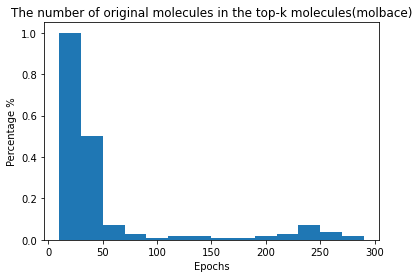

In [7]:
new_dict = {}
topk_mol = []

for k, v in topk_mols_dict.items():
    length_v = len(v)
    count = 0
    for i in range(length_v):
        if v[i].smiles != '':
            topk_mol.append(v[i].smiles)
            count += 1    
    percentage = round(count / length_v,4)
    new_dict[k] = percentage

import matplotlib.pyplot as plt

fig, ax = plt.subplots()
ax.bar(new_dict.keys(), new_dict.values(), width=20)
ax.set_title('The number of original molecules in the top-k molecules(molbace)')
ax.set_xlabel('Epochs')
ax.set_ylabel('Percentage %')
plt.show()

In [8]:
labeled_dataset = get_dataset(args, './raw_data')
labeled_dataset_list = [data for data in labeled_dataset]
smile_path = os.path.join('./raw_data', '_'.join(args.dataset.split('-')), 'mapping/mol.csv.gz')
smiles_df = pd.read_csv(smile_path, compression='gzip', usecols=['smiles'])
smiles = smiles_df['smiles'].tolist() 
new_labeled_dataset = ogbg_with_smiles(name = args.dataset,
                                   root = './raw_data',
                                   data_list = labeled_dataset_list, 
                                   smile_list = smiles)
label_split_idx = new_labeled_dataset.get_idx_split(split_type = 'scaffold')
label_split_idx_random = new_labeled_dataset.get_idx_split(split_type = 'random')

split_list = convert_idx_list(label_split_idx)
split_list_random = convert_idx_list(label_split_idx_random)
# append ths split_list to smile datframe
smiles_df['split'] = split_list
#smiles_df['y'] = y_list
smiles_df['split_random'] = split_list_random
smiles_df.head(5)

,smiles,split,split_random
0,O1CC[C@@H](NC(=O)[C@@H](Cc2cc3cc(ccc3nc2N)-c2c...,test,train
1,Fc1cc(cc(F)c1)C[C@H](NC(=O)[C@@H](N1CC[C@](NC(...,test,valid
2,S1(=O)(=O)N(c2cc(cc3c2n(cc3CC)CC1)C(=O)N[C@H](...,train,train
3,S1(=O)(=O)C[C@@H](Cc2cc(O[C@H](COCC)C(F)(F)F)c...,train,train
4,S1(=O)(=O)N(c2cc(cc3c2n(cc3CC)CC1)C(=O)N[C@H](...,train,train


In [10]:
# initial_topk = topk_mols_dict[20]
# initial_topk_smiles = [mol.smiles for mol in initial_topk]

smiles_df['topk'] = smiles_df['smiles'].apply(lambda x: "aug" if x in topk_mol else "no_aug")
smiles_df.loc[smiles_df['topk'] == 'no_aug', 'topk'] = smiles_df.loc[smiles_df['topk'] == 'no_aug', 'split']


In [11]:
smiles_df['topk'].value_counts()

train    1025
aug       185
test      152
valid     151
Name: topk, dtype: int64

<AxesSubplot:label='scatter', title={'center':'ogbg-molbace scaffold split t-sne'}, xlabel='t-SNE-1', ylabel='t-SNE-2'>

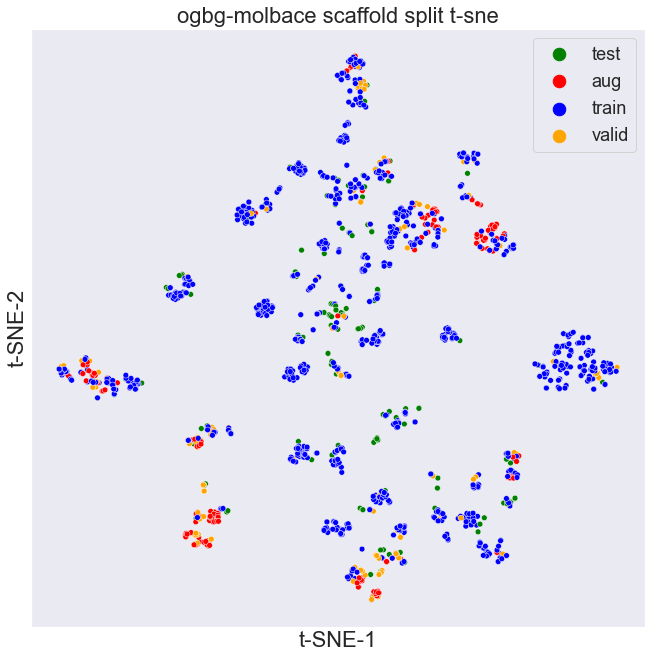

In [12]:
plot = Orig_Plotter.from_smiles(smiles_df["smiles"], target=smiles_df["topk"] ,target_type="C", sim_type='structural')
plot.tsne(random_state=0)
plot.visualize_plot(kind = 'scatter', size = 11, title=f'{args.dataset} scaffold split t-sne')



In [13]:
from bokeh.io import output_notebook
output_notebook()

Loading BokehJS ...

In [14]:
plot.interactive_plot(show_plot=True)

Figure(id='1003', ...)

## Examine the Generated Labels

In [13]:
import torch 
import matplotlib.pyplot as plt
import pandas as pd

label_dir = f'figures/label_imbalance'
file_name = 'ogbg-moltox21_gin-virtual_nc30_topk100.pt'

# load the result
label_dist = torch.load(f'{label_dir}/{file_name}')
label_dist = torch.cat(label_dist)
# label_dist = [x.item() for x in label_dist]

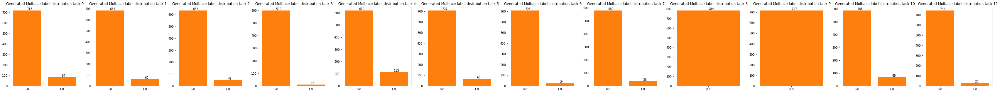

In [17]:
if label_dist.shape[-1] == 1:
    if 'regression' in labeled_dataset.task_type:
        # plot the histogram of the numerical labels
        plt.figure()
        pd.Series(new_labeled_dataset.y.view(-1)).hist(bins=50)
        plt.title(f'{args.dataset} label histogram')
        plt.show()
    else:
        pd.Series(label_dist[:,0].numpy()).value_counts().sort_index().plot(kind='bar')

else:
    fig, axs = plt.subplots(1, label_dist.shape[-1], figsize=(5*label_dist.shape[-1], 5))
    for i in range(label_dist.shape[-1]):
        # plot the label distribution for each column
        value_counts = pd.Series(label_dist[:,i].numpy()).value_counts()
        value_counts = value_counts.sort_index()
        value_counts.index = value_counts.index.astype(str)
        bars = axs[i].bar(value_counts.index, value_counts.values)
        axs[i].bar(value_counts.index, value_counts.values)
        axs[i].set_title(f' Generated Molbace label distribution task {i}')
        
        for bar in bars:
            yval = bar.get_height()
            axs[i].text(bar.get_x() + bar.get_width()/2.0, yval, int(yval), va='bottom')  # va: vertical alignment
        
    plt.show()
    
    

<AxesSubplot:title={'center':'Generated Label distribution of ogbg-molbbbp'}>

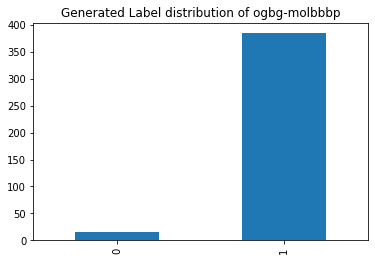

In [21]:
pd.Series(label_dist).value_counts().sort_index().plot(kind='bar', 
                                                       title='Generated Label distribution of ogbg-molbbbp')

